In [1]:
import pickle
from helper_fxns import convert_param_vec_dict_to_param_dict, gelman_rubin_trace_dict, print_convergence_summary, sample_plots, create_trace_matrix, plot_histograms
from earm.lopez_embedded import model
%matplotlib inline
import os
import numpy as np
from corner import corner
import matplotlib.pyplot as plt
import seaborn as sns

/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)
/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/utils/traitlets.py:5: UserWarning: IPython.utils.traitlets has moved to a top-level traitlets package.
  warn("IPython.utils.traitlets has moved to a top-level traitlets package.")


In [2]:
os.chdir('/Users/Erin/git/accre_data_analysis/gamma_levels_25000burnin/')

In [3]:
traces = {}
for trace in ['a', 'b', 'c', 'd']:
    traces[trace] = [np.load('earm_dreamzs_3chain_uniform_gammalevels_25000burnin_'+str(trace)+'_sampled_params_chain_0.npy')]
    for chain in range(1, 3):
        traces[trace].append(np.load('earm_dreamzs_3chain_uniform_gammalevels_25000burnin_'+str(trace)+'_sampled_params_chain_'+str(chain)+'.npy'))

In [4]:
logps = {}
for trace in ['a', 'b', 'c', 'd']:
    logps[trace] = [np.load('earm_dreamzs_3chain_uniform_gammalevels_25000burnin_'+str(trace)+'_logps_chain_0.npy')]
    print 'Logp of trace: ',trace,' chain: 0 = ',logps[trace][-1]
    for chain in range(1, 3):
        logps[trace].append(np.load('earm_dreamzs_3chain_uniform_gammalevels_25000burnin_'+str(trace)+'_logps_chain_'+str(chain)+'.npy'))
        print 'Logp of trace: ',trace,' chain: ',chain,' = ',logps[trace][-1][-1]

Logp of trace:  a  chain: 0 =  [[ 105.41383006]
 [ 105.41383006]
 [ 105.41383006]
 ..., 
 [ 106.38110731]
 [ 106.38110731]
 [ 106.38110731]]
Logp of trace:  a  chain:  1  =  [ 104.53551692]
Logp of trace:  a  chain:  2  =  [ 106.38144986]
Logp of trace:  b  chain: 0 =  [[ 103.28783142]
 [ 103.28783142]
 [ 103.28783142]
 ..., 
 [ 102.93875864]
 [ 102.93875864]
 [ 102.93875864]]
Logp of trace:  b  chain:  1  =  [ 103.3921783]
Logp of trace:  b  chain:  2  =  [ 106.80328339]
Logp of trace:  c  chain: 0 =  [[ 104.51514077]
 [ 104.51514077]
 [ 104.51514077]
 ..., 
 [ 107.02191431]
 [ 107.02191431]
 [ 107.02191431]]
Logp of trace:  c  chain:  1  =  [ 105.92528625]
Logp of trace:  c  chain:  2  =  [ 106.45786695]
Logp of trace:  d  chain: 0 =  [[ 104.56939858]
 [ 104.56939858]
 [ 104.56939858]
 ..., 
 [ 105.01453883]
 [ 104.57164988]
 [ 104.57164988]]
Logp of trace:  d  chain:  1  =  [ 104.50279565]
Logp of trace:  d  chain:  2  =  [ 108.17665229]


In [5]:
traces['a'][0][:,72]

array([ 6.17740271,  6.17740271,  6.17740271, ...,  1.65846003,
        1.65846003,  1.65846003])

In [6]:
param_trace_dicts = {}
param_trace_dict_a = {}
gelman_rubin_dicts = {}
param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]
for run in ['a', 'b', 'c', 'd']:
    for i, param in enumerate(model.parameters_rules()):
        param_trace_dict_a[param.name] = [traces[run][chain][:,i] for chain in range(len(traces[run]))]
    param_trace_dicts[run] = param_trace_dict_a
    gelman_rubin_dicts[run] = gelman_rubin_trace_dict(param_trace_dict_a)
    param_trace_dict_a = {}
    param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]

In [7]:
print_convergence_summary(param_trace_dicts['a'])

Number of parameters with GR below 1.2:  78  of  105  parameters.
Percent of parameters with GR below 1.2:  74.2857142857
Number of parameters with GR below 1.1:  52  of  105  parameters.
Percent of parameters with GR below 1.1:  49.5238095238


[78, 74.28571428571429, 52, 49.523809523809526]

In [8]:
print_convergence_summary(param_trace_dicts['b'])

Number of parameters with GR below 1.2:  84  of  105  parameters.
Percent of parameters with GR below 1.2:  80.0
Number of parameters with GR below 1.1:  53  of  105  parameters.
Percent of parameters with GR below 1.1:  50.4761904762


[84, 80.0, 53, 50.476190476190474]

In [9]:
print_convergence_summary(param_trace_dicts['c'])

Number of parameters with GR below 1.2:  64  of  105  parameters.
Percent of parameters with GR below 1.2:  60.9523809524
Number of parameters with GR below 1.1:  38  of  105  parameters.
Percent of parameters with GR below 1.1:  36.1904761905


[64, 60.952380952380956, 38, 36.19047619047619]

In [10]:
print_convergence_summary(param_trace_dicts['d'])

Number of parameters with GR below 1.2:  104  of  105  parameters.
Percent of parameters with GR below 1.2:  99.0476190476
Number of parameters with GR below 1.1:  94  of  105  parameters.
Percent of parameters with GR below 1.1:  89.5238095238


[104, 99.04761904761905, 94, 89.52380952380953]

50000
3
50000


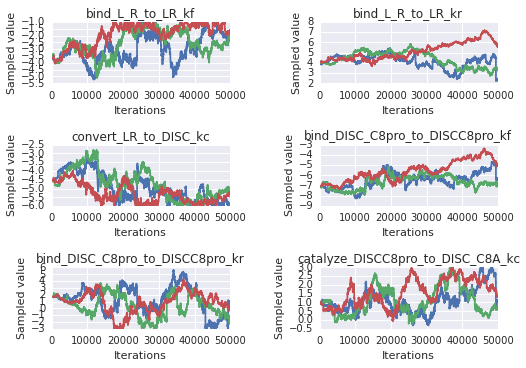

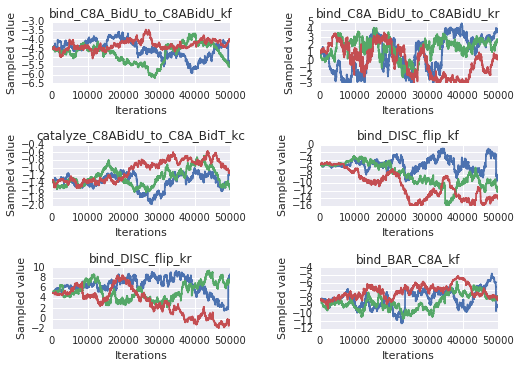

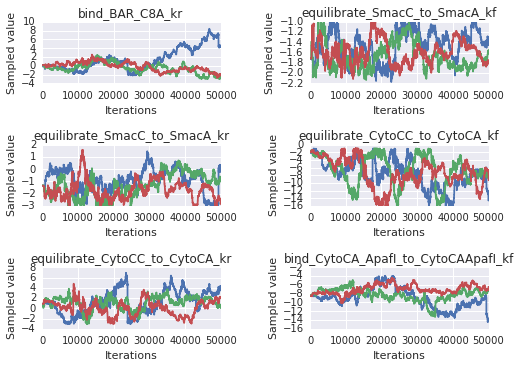

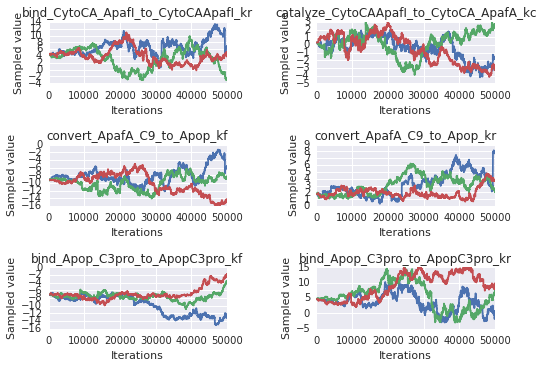

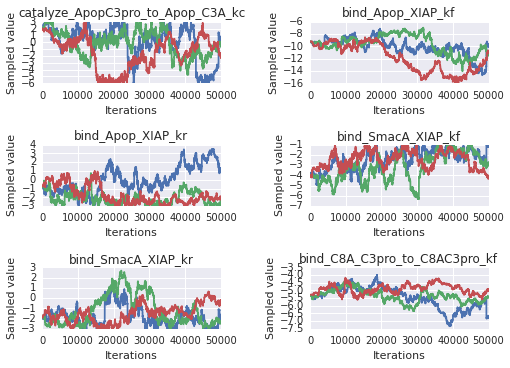

...

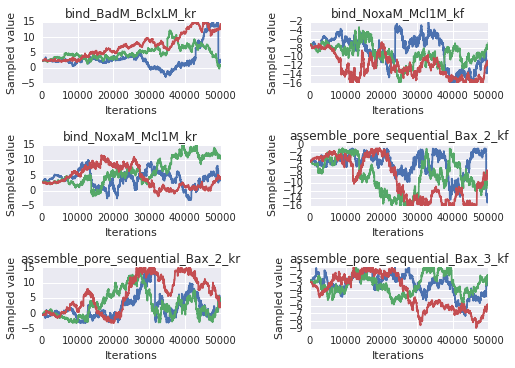

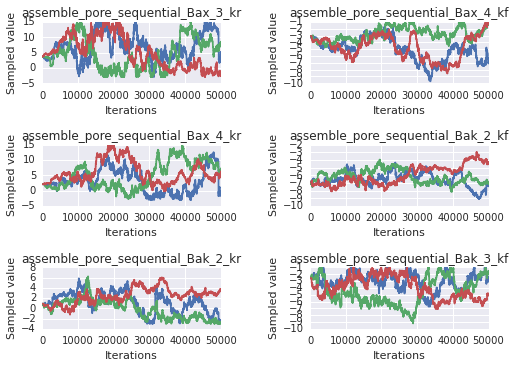

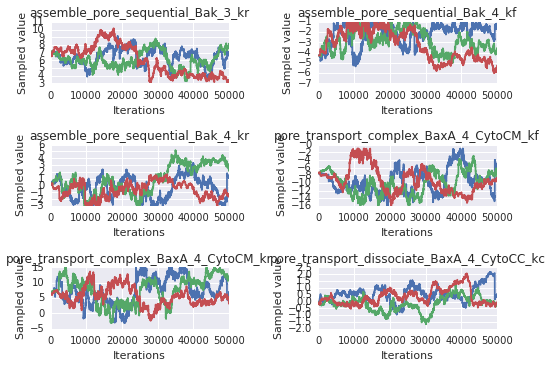

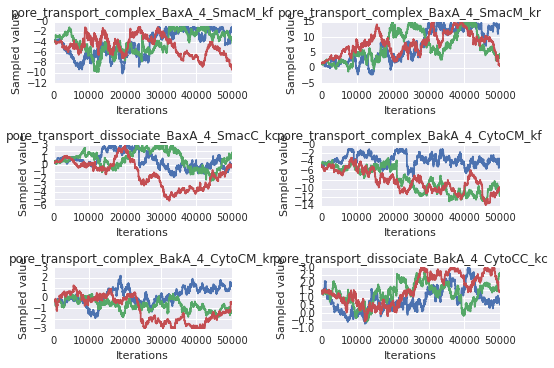

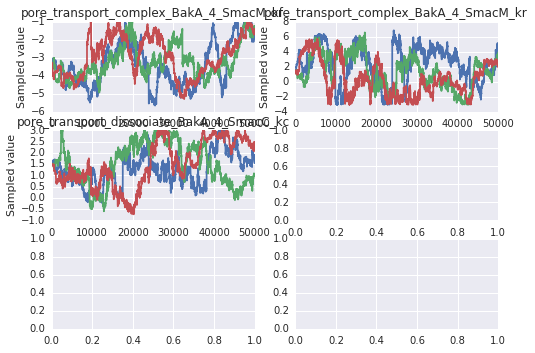

In [11]:
sample_plots(param_trace_dicts['a'])

50000
3
50000


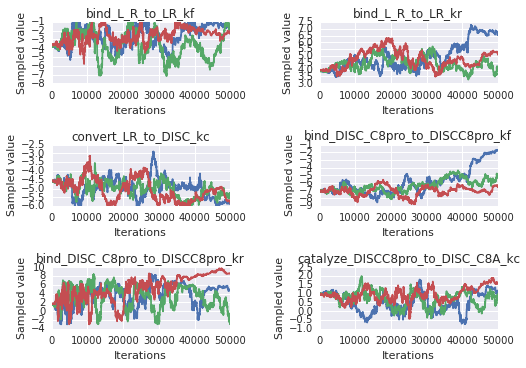

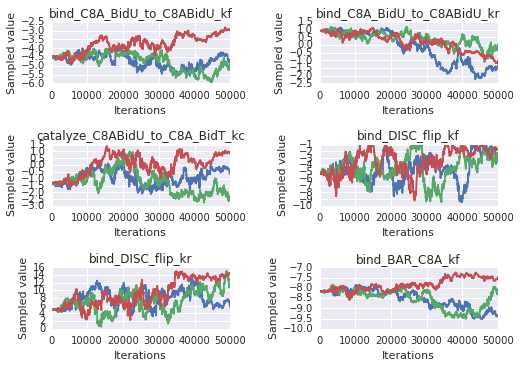

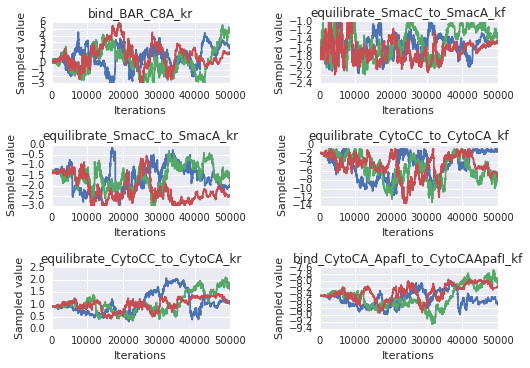

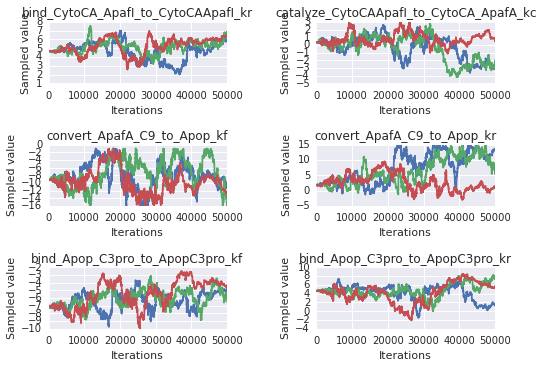

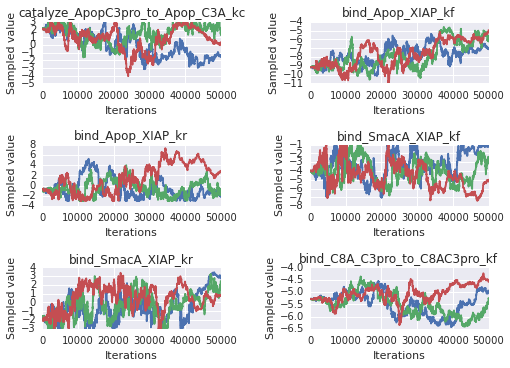

...

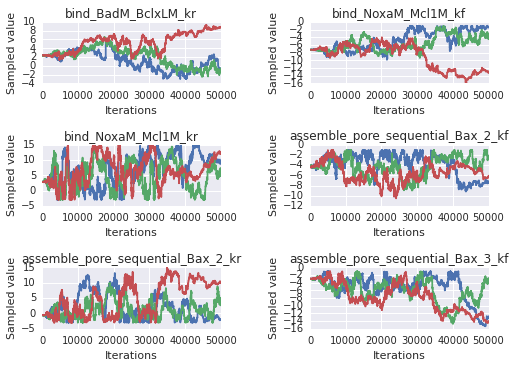

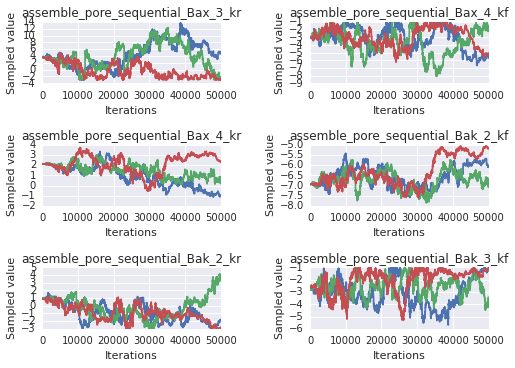

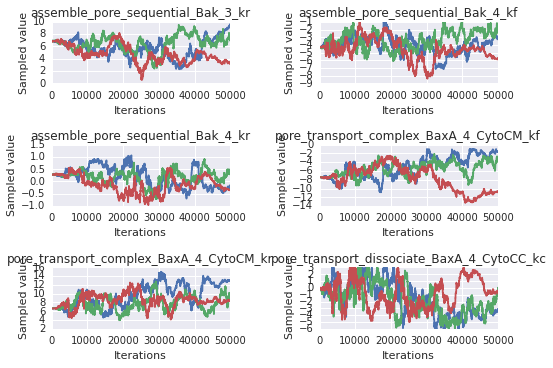

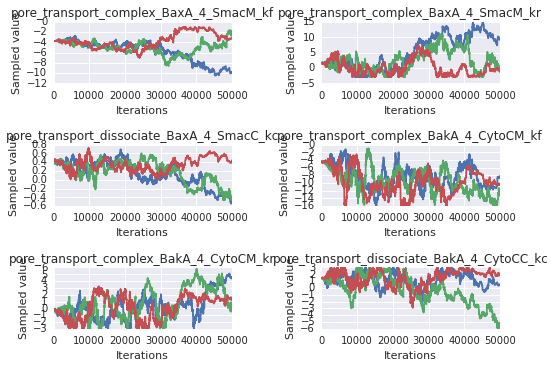

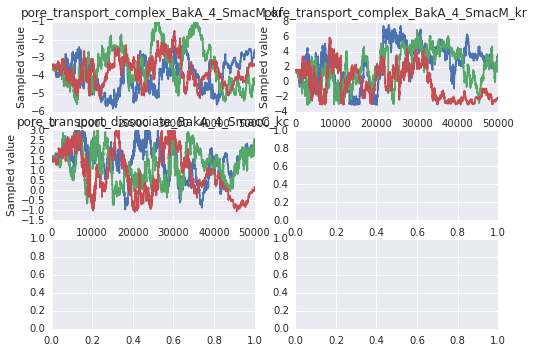

In [12]:
sample_plots(param_trace_dicts['b'])

50000
3
50000


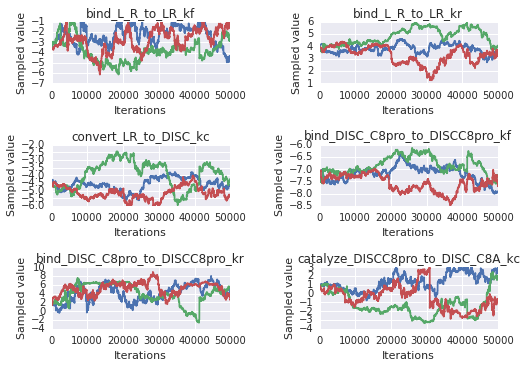

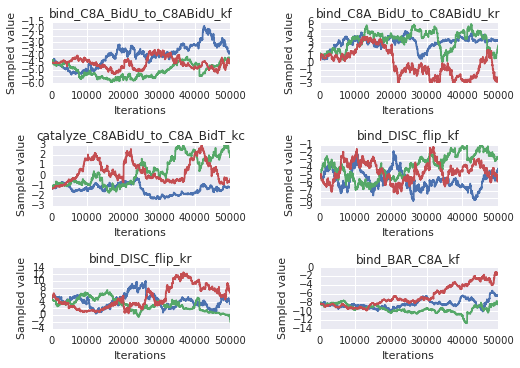

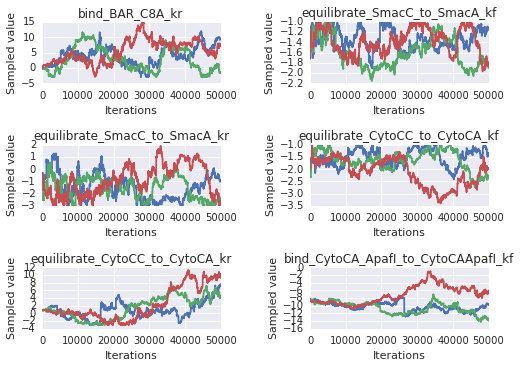

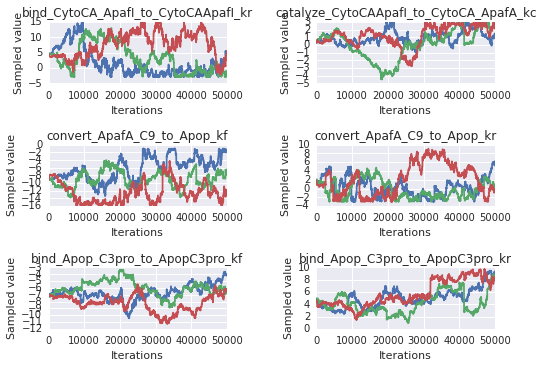

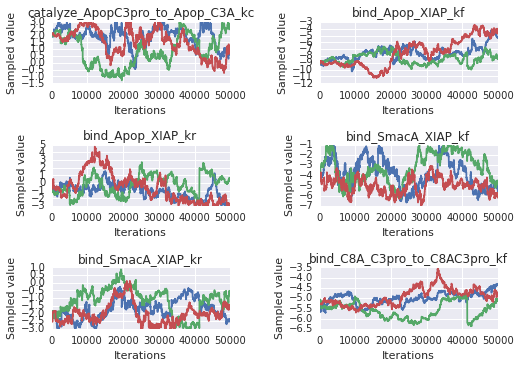

...

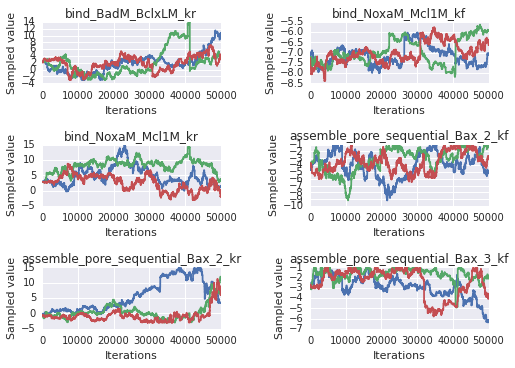

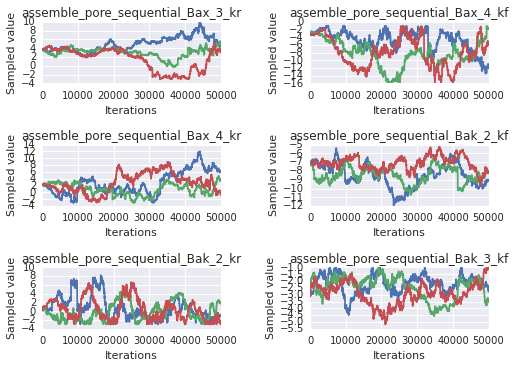

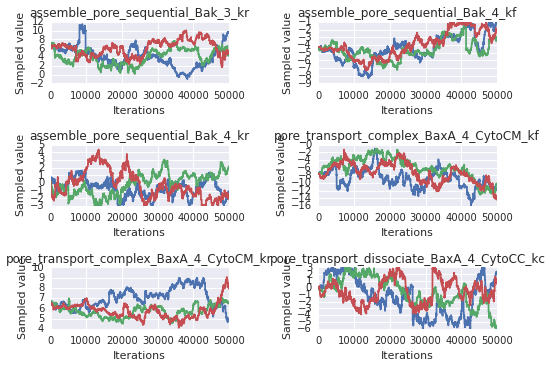

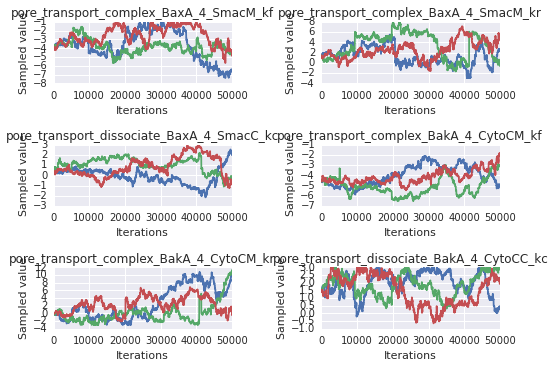

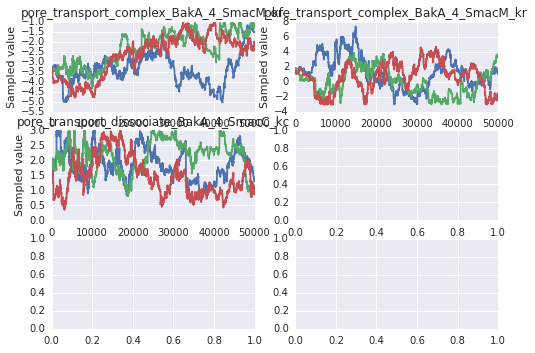

In [13]:
sample_plots(param_trace_dicts['c'])

In [14]:
trace_arr_a = create_trace_matrix(param_trace_dicts['a'], burnin=25000, thin=1)
trace_arr_b = create_trace_matrix(param_trace_dicts['b'], burnin=25000, thin=1)
trace_arr_c = create_trace_matrix(param_trace_dicts['c'], burnin=25000, thin=1)
trace_arr_d = create_trace_matrix(param_trace_dicts['d'], burnin=25000, thin=1)

In [15]:
trace_arr_a_short = create_trace_matrix(param_trace_dicts['a'], burnin=40000, thin=1)
trace_arr_b_short = create_trace_matrix(param_trace_dicts['b'], burnin=40000, thin=1)
trace_arr_c_short = create_trace_matrix(param_trace_dicts['c'], burnin=40000, thin=1)
trace_arr_d_short = create_trace_matrix(param_trace_dicts['d'], burnin=40000, thin=1)

In [14]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    sns.plotting_context('notebook')
    ax = sns.distplot(trace_arr_a_short[:,dim], hist=True, color='b')
    sns.distplot(trace_arr_b_short[:,dim], hist=True, color='y')
    sns.distplot(trace_arr_c_short[:,dim], hist=True, color='r')
    sns.distplot(trace_arr_d_short[:,dim], hist=True, color='g')
    if gelman_rubin_dicts['a'][param_name] < 1.2:
        sns.axlabel(param_name+' - converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')
    else:
        sns.axlabel(param_name+' - not converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')

NameError: name 'trace_arr_a_short' is not defined

/System/Library/Frameworks/Python.framework/Versions/2.7/Extras/lib/python/matplotlib/pyplot.py:412: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_num_figures`).
  max_open_warning, RuntimeWarning)


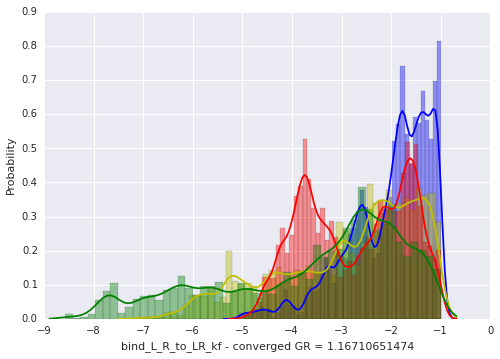

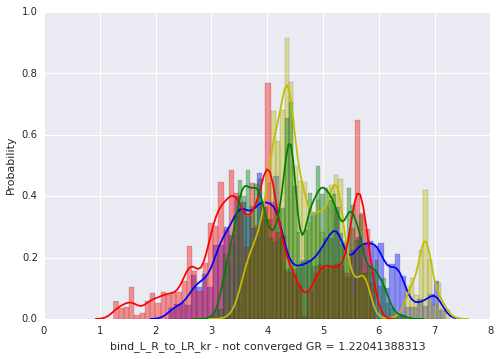

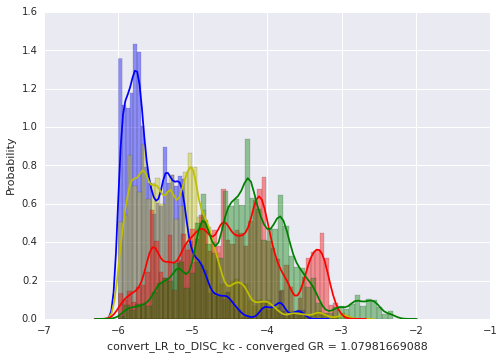

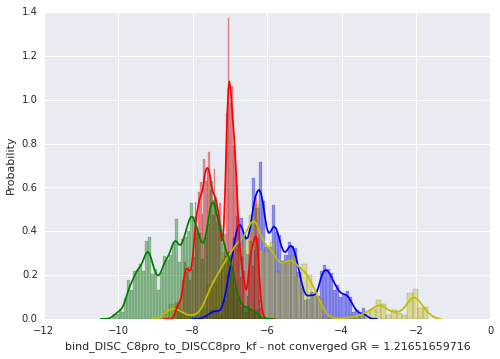

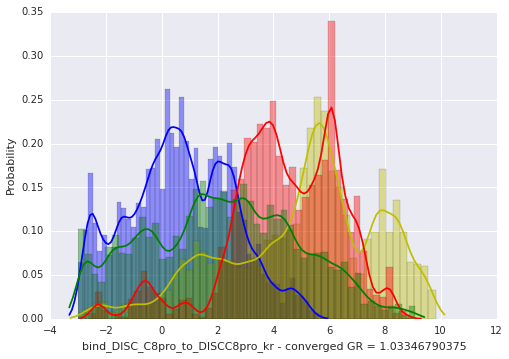

...

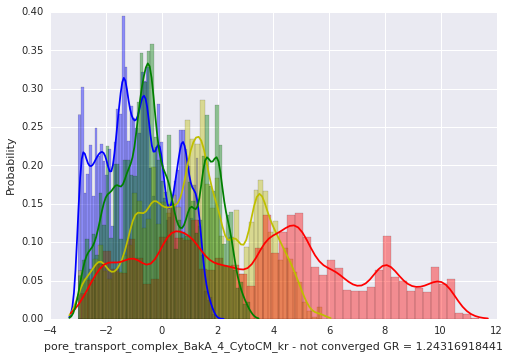

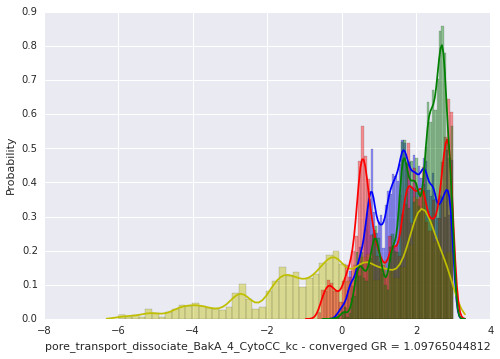

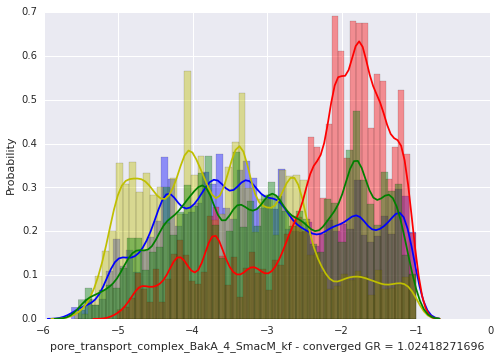

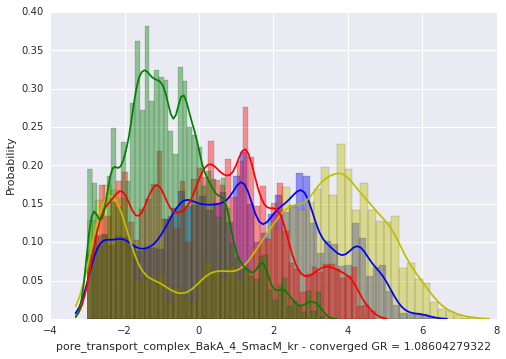

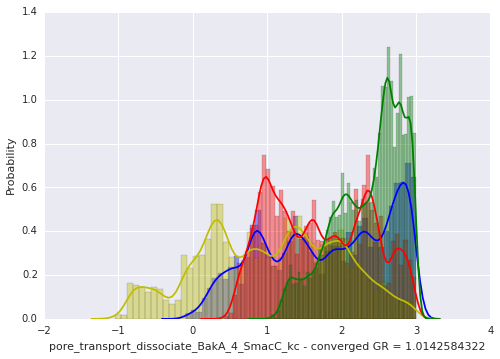

In [16]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    sns.plotting_context('notebook')
    ax = sns.distplot(trace_arr_a[:,dim], hist=True, color='b')
    sns.distplot(trace_arr_b[:,dim], hist=True, color='y')
    sns.distplot(trace_arr_c[:,dim], hist=True, color='r')
    sns.distplot(trace_arr_d[:,dim], hist=True, color='g')
    if gelman_rubin_dicts['a'][param_name] < 1.2:
        sns.axlabel(param_name+' - converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')
    else:
        sns.axlabel(param_name+' - not converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')

In [17]:
traces['a'][1][:,0]

array([-3.63055501, -3.63055501, -3.63055501, ..., -1.63040459,
       -1.63040459, -1.63040459])

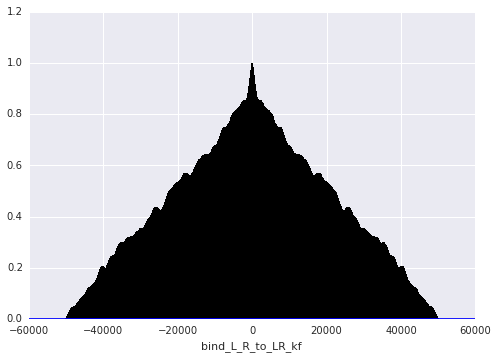

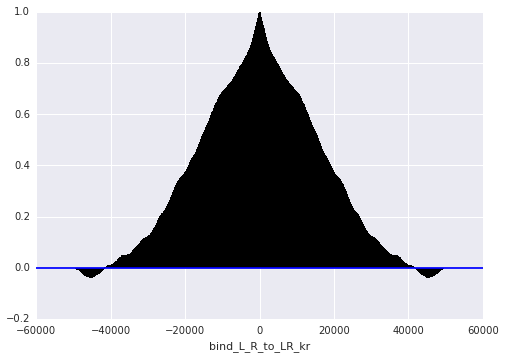

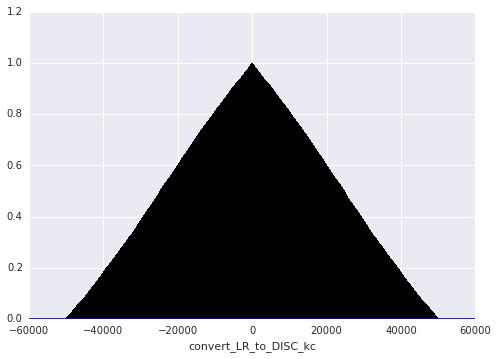

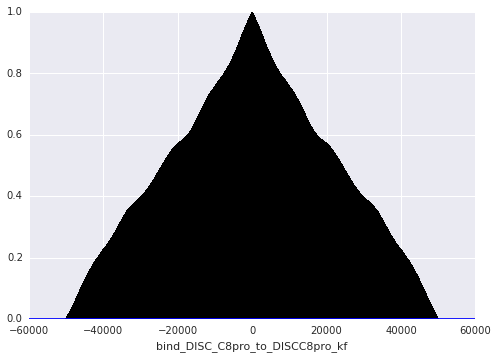

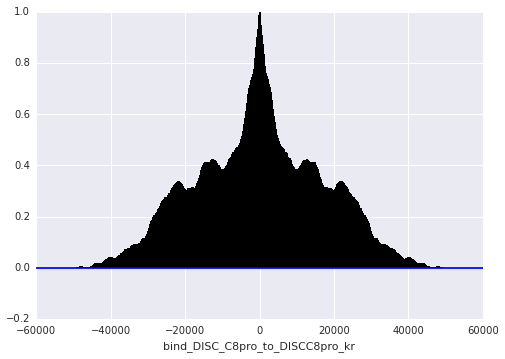

...

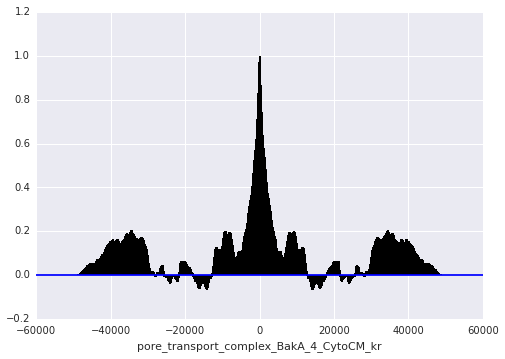

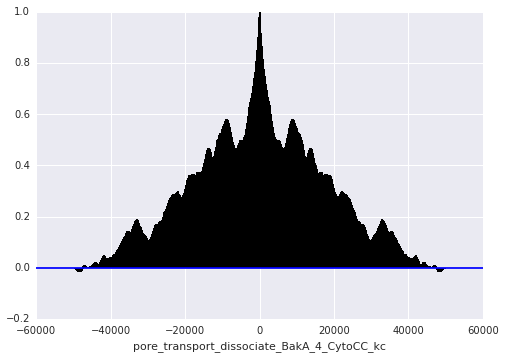

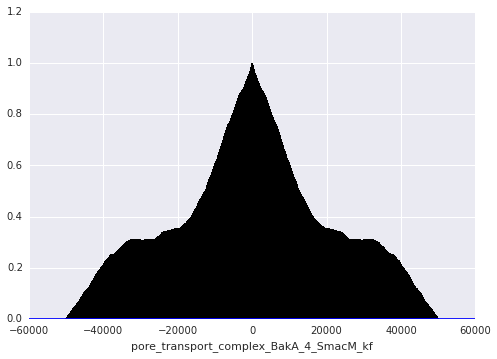

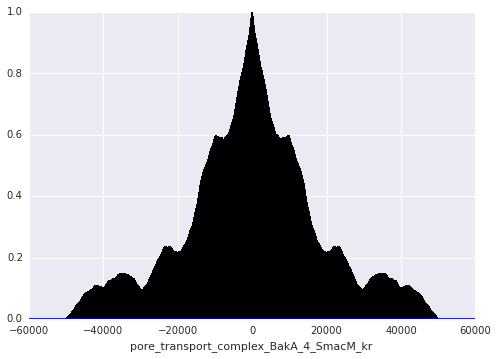

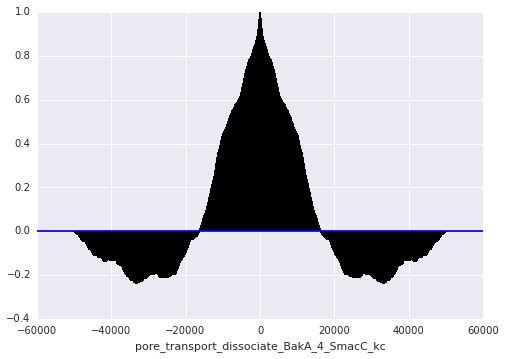

In [37]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][0][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

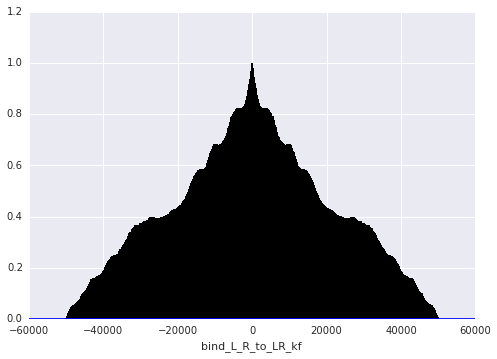

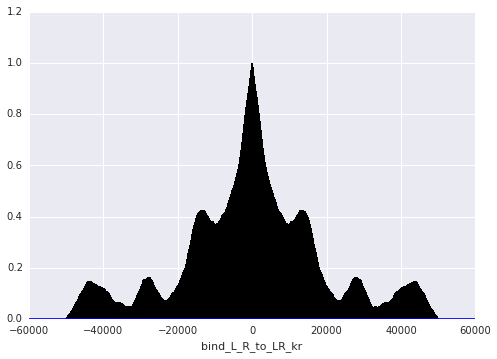

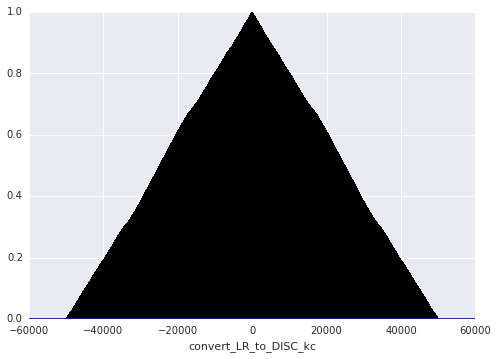

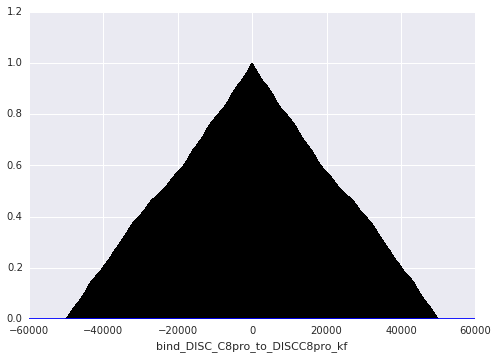

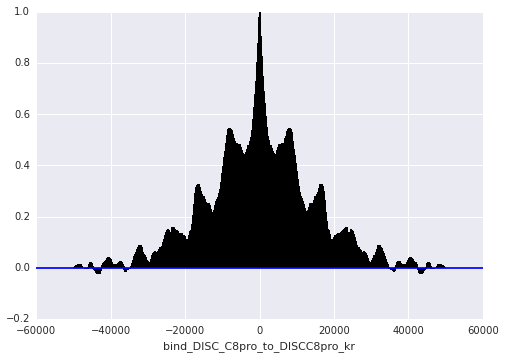

...

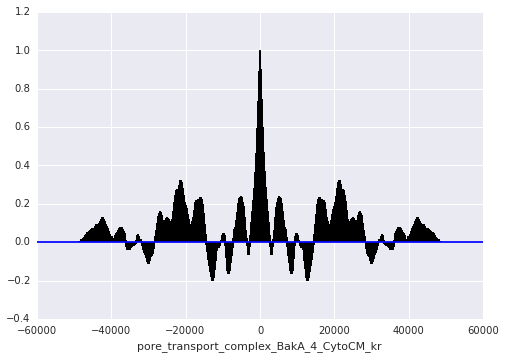

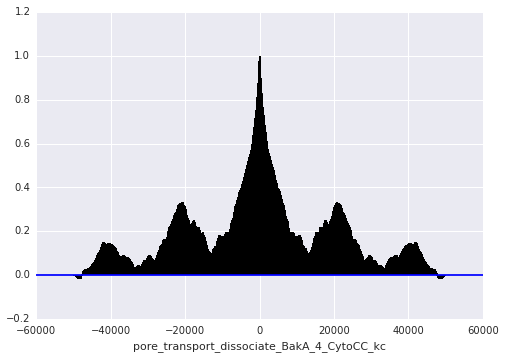

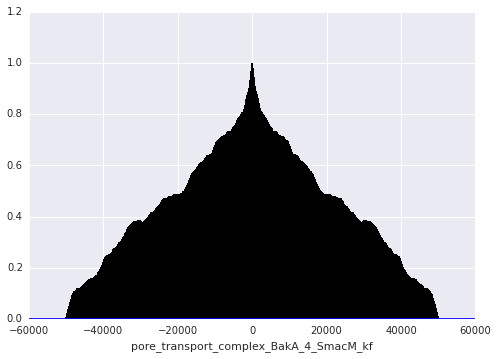

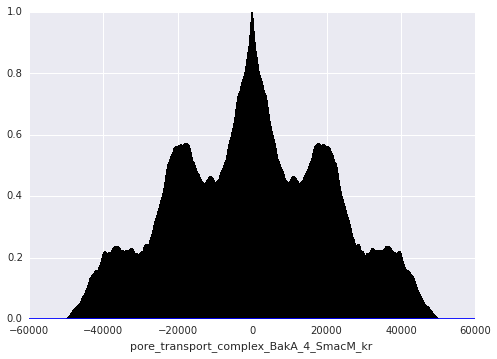

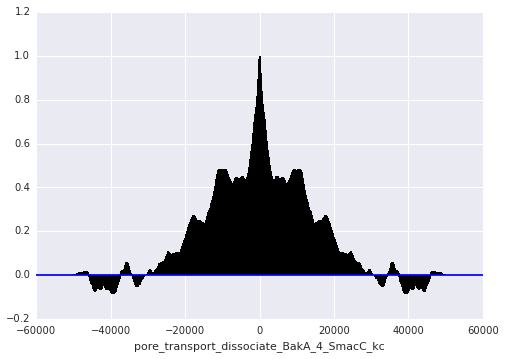

In [38]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][1][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

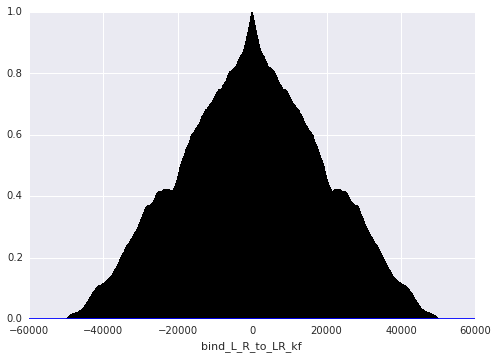

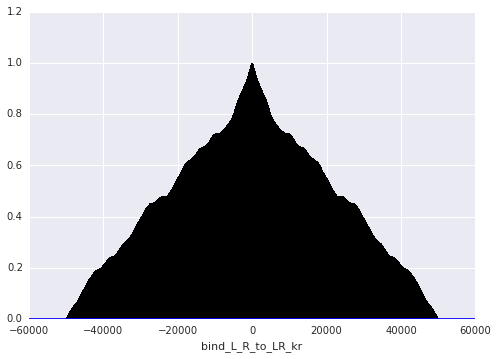

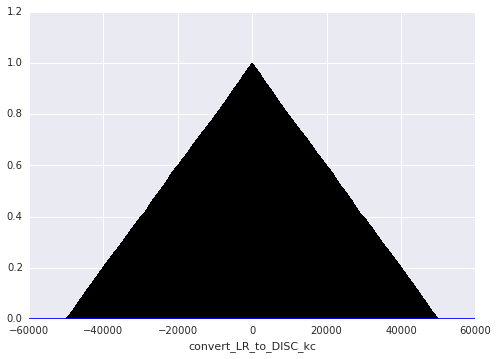

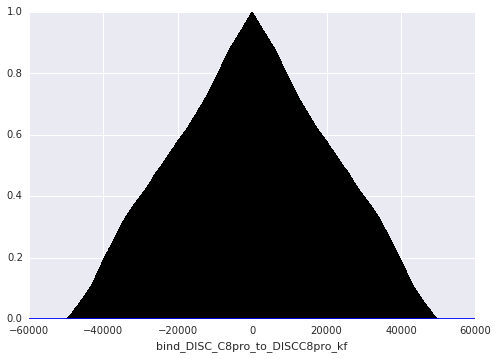

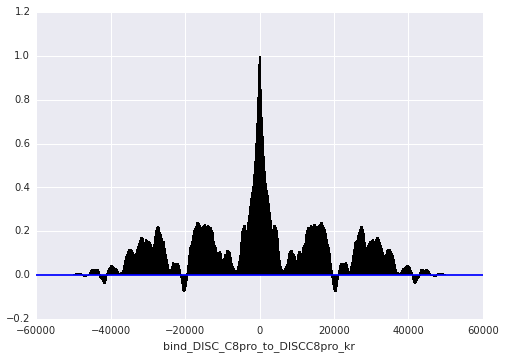

...

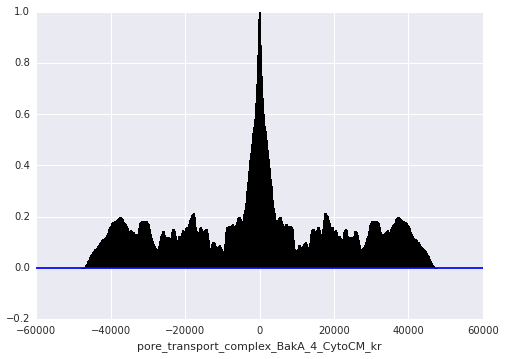

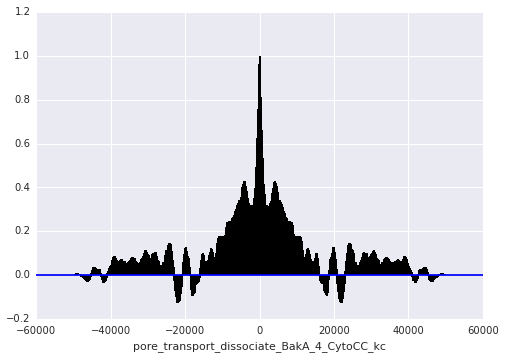

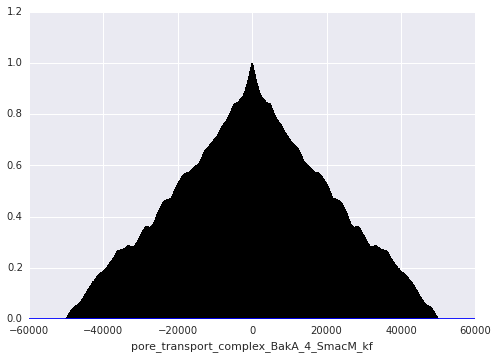

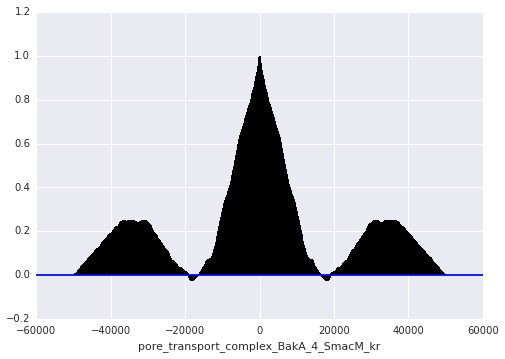

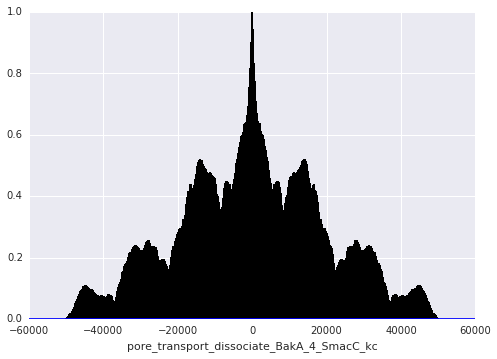

In [39]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][2][:,dim], maxlags=None)
    plt.xlabel(str(param_name))

In [ ]:
corner(trace_arr_a[:,50:60:], labels=param_trace_dict_a['param_list'][50:60], bins=10)

In [18]:
acceptance_rates = np.zeros((len(traces['a'][0][0],)))
vector_acceptance_rate = 0
running_acceptance_rates = np.zeros((len(traces['a'][0][0]), len(traces['a'][0])))
running_acceptance_rates_100window = np.zeros((len(traces['a'][0][0]), 500))
n_vector_acceptances = 0
n_100windowvec_acceptances = 0
running_acceptance_rates_vec = np.zeros((1, len(traces['a'][0])))
running_acceptances_rates_vec_100window = np.zeros((1, 500))
for dim in range(len(traces['a'][0][0])):
    n_100window_acceptances = 0
    n_acceptances = 0
    
    for iteration in range(1, len(traces['a'][0])):
        if dim == 0:
            comparison = traces['a'][0][iteration] == traces['a'][0][iteration-1]
            if not np.all(comparison):
                n_vector_acceptances += 1
                n_100windowvec_acceptances += 1
            running_acceptance_rates_vec[0, iteration] = float(n_vector_acceptances)/iteration
            if iteration % 100 == 0:
                running_acceptances_rates_vec_100window[0, iteration/100] = float(n_100windowvec_acceptances)/100
                n_100windowvec_acceptances = 0
        if traces['a'][0][iteration][dim] != traces['a'][0][iteration-1][dim]:
            n_acceptances += 1
            n_100window_acceptances += 1
        running_acceptance_rates[dim, iteration] = float(n_acceptances)/iteration
        
        if iteration % 100 == 0:
            running_acceptance_rates_100window[dim, iteration/100] = float(n_100window_acceptances)/100
            n_100window_acceptances = 0
            
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][0])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
print 'n vector acceptances: ',n_vector_acceptances
print 'Acceptance rate for vector: ',float(n_vector_acceptances)/len(traces['a'][0])
running_acceptance_rates
running_acceptance_rates_100window
running_acceptance_rates_vec
running_acceptances_rates_vec_100window

N acceptances for parameter:  bind_L_R_to_LR_kf  =  6853  acceptance rate:  0.13706
N acceptances for parameter:  bind_L_R_to_LR_kr  =  6742  acceptance rate:  0.13484
N acceptances for parameter:  convert_LR_to_DISC_kc  =  6743  acceptance rate:  0.13486
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  6630  acceptance rate:  0.1326
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  6821  acceptance rate:  0.13642
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  6814  acceptance rate:  0.13628
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  6730  acceptance rate:  0.1346
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  6721  acceptance rate:  0.13442
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  6728  acceptance rate:  0.13456
N acceptances for parameter:  bind_DISC_flip_kf  =  6851  acceptance rate:  0.13702
N acceptances for parameter:  bind_DISC_flip_kr  =  6691  acceptance rate:  0.13

array([[ 0.  ,  0.01,  0.09,  0.15,  0.29,  0.22,  0.26,  0.36,  0.27,
         0.32,  0.37,  0.38,  0.31,  0.32,  0.35,  0.34,  0.39,  0.39,
         0.43,  0.46,  0.47,  0.4 ,  0.37,  0.32,  0.49,  0.47,  0.43,
         0.36,  0.35,  0.42,  0.37,  0.37,  0.35,  0.35,  0.36,  0.3 ,
         0.37,  0.34,  0.38,  0.36,  0.35,  0.32,  0.31,  0.48,  0.41,
         0.33,  0.36,  0.36,  0.33,  0.33,  0.35,  0.27,  0.28,  0.33,
         0.36,  0.35,  0.36,  0.29,  0.2 ,  0.26,  0.35,  0.29,  0.33,
         0.28,  0.37,  0.26,  0.34,  0.18,  0.24,  0.24,  0.34,  0.24,
         0.34,  0.3 ,  0.32,  0.23,  0.37,  0.25,  0.18,  0.3 ,  0.34,
         0.4 ,  0.36,  0.24,  0.38,  0.36,  0.27,  0.38,  0.31,  0.3 ,
         0.31,  0.34,  0.31,  0.31,  0.35,  0.37,  0.34,  0.43,  0.26,
         0.43,  0.37,  0.32,  0.33,  0.36,  0.28,  0.34,  0.31,  0.33,
         0.35,  0.26,  0.29,  0.35,  0.29,  0.33,  0.27,  0.31,  0.35,
         0.32,  0.28,  0.36,  0.32,  0.26,  0.34,  0.25,  0.31,  0.28,
      

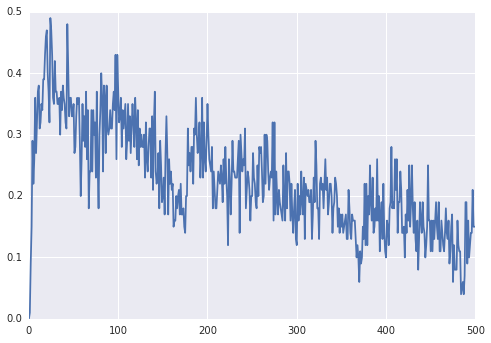

In [19]:
plt.plot(range(500), running_acceptances_rates_vec_100window[0,:])

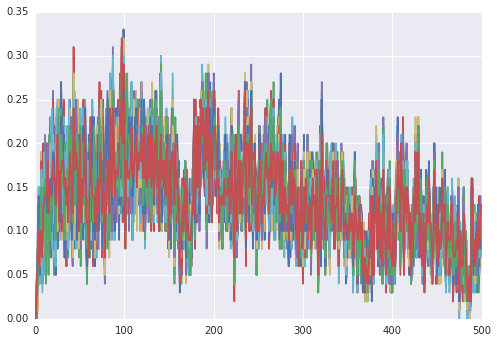

In [20]:
for dim in range(105):
    plt.plot(range(500), running_acceptance_rates_100window[dim, :])

In [21]:
acceptance_rates = np.zeros((len(traces['a'][1][0],)))
running_acceptance_rates = np.zeros((len(traces['a'][1][0]), len(traces['a'][1])))
running_acceptance_rates_100window = np.zeros((len(traces['a'][1][0]), 500))
for dim in range(len(traces['a'][1][0])):
    n_100window_acceptances = 0
    n_acceptances = 0
    
    for iteration in range(1, len(traces['a'][1])):
        if traces['a'][1][iteration][dim] != traces['a'][1][iteration-1][dim]:
            n_acceptances += 1
            n_100window_acceptances += 1
        running_acceptance_rates[dim, iteration] = float(n_acceptances)/iteration
        if iteration % 100 == 0:
            running_acceptance_rates_100window[dim, iteration/100] = float(n_100window_acceptances)/100
            n_100window_acceptances = 0
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][1])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
running_acceptance_rates
running_acceptance_rates_100window

N acceptances for parameter:  bind_L_R_to_LR_kf  =  6174  acceptance rate:  0.12348
N acceptances for parameter:  bind_L_R_to_LR_kr  =  6033  acceptance rate:  0.12066
N acceptances for parameter:  convert_LR_to_DISC_kc  =  5955  acceptance rate:  0.1191
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  6027  acceptance rate:  0.12054
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  6074  acceptance rate:  0.12148
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  6117  acceptance rate:  0.12234
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  6123  acceptance rate:  0.12246
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  6083  acceptance rate:  0.12166
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  6136  acceptance rate:  0.12272
N acceptances for parameter:  bind_DISC_flip_kf  =  6206  acceptance rate:  0.12412
N acceptances for parameter:  bind_DISC_flip_kr  =  6150  acceptance rate:  0.1

array([[ 0.  ,  0.02,  0.03, ...,  0.09,  0.1 ,  0.07],
       [ 0.  ,  0.01,  0.06, ...,  0.12,  0.11,  0.06],
       [ 0.  ,  0.02,  0.05, ...,  0.12,  0.11,  0.06],
       ..., 
       [ 0.  ,  0.01,  0.03, ...,  0.1 ,  0.11,  0.07],
       [ 0.  ,  0.01,  0.07, ...,  0.09,  0.1 ,  0.05],
       [ 0.  ,  0.01,  0.04, ...,  0.1 ,  0.09,  0.08]])

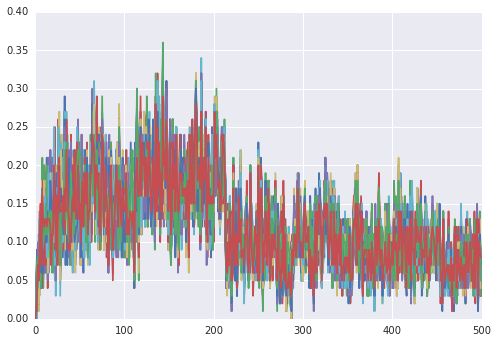

In [22]:
for dim in range(105):
    plt.plot(range(500), running_acceptance_rates_100window[dim, :])

In [23]:
acceptance_rates = np.zeros((len(traces['a'][2][0],)))
running_acceptance_rates = np.zeros((len(traces['a'][2][0]), len(traces['a'][2])))
running_acceptance_rates_100window = np.zeros((len(traces['a'][2][0]), 500))
for dim in range(len(traces['a'][2][0])):
    n_100window_acceptances = 0
    n_acceptances = 0
    
    for iteration in range(1, len(traces['a'][2])):
        if traces['a'][2][iteration][dim] != traces['a'][2][iteration-1][dim]:
            n_acceptances += 1
            n_100window_acceptances += 1
        running_acceptance_rates[dim, iteration] = float(n_acceptances)/iteration
        if iteration % 100 == 0:
            running_acceptance_rates_100window[dim, iteration/100] = float(n_100window_acceptances)/100
            n_100window_acceptances = 0
    acceptance_rates[dim] = float(n_acceptances)/len(traces['a'][2])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
running_acceptance_rates
running_acceptance_rates_100window

N acceptances for parameter:  bind_L_R_to_LR_kf  =  5134  acceptance rate:  0.10268
N acceptances for parameter:  bind_L_R_to_LR_kr  =  5101  acceptance rate:  0.10202
N acceptances for parameter:  convert_LR_to_DISC_kc  =  5051  acceptance rate:  0.10102
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  5085  acceptance rate:  0.1017
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  5178  acceptance rate:  0.10356
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  5131  acceptance rate:  0.10262
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  5120  acceptance rate:  0.1024
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  5081  acceptance rate:  0.10162
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  5149  acceptance rate:  0.10298
N acceptances for parameter:  bind_DISC_flip_kf  =  5197  acceptance rate:  0.10394
N acceptances for parameter:  bind_DISC_flip_kr  =  5157  acceptance rate:  0.10

array([[ 0.  ,  0.  ,  0.01, ...,  0.06,  0.05,  0.07],
       [ 0.  ,  0.02,  0.01, ...,  0.06,  0.04,  0.06],
       [ 0.  ,  0.  ,  0.03, ...,  0.05,  0.05,  0.07],
       ..., 
       [ 0.  ,  0.01,  0.05, ...,  0.06,  0.05,  0.07],
       [ 0.  ,  0.02,  0.04, ...,  0.06,  0.04,  0.07],
       [ 0.  ,  0.01,  0.03, ...,  0.05,  0.03,  0.09]])

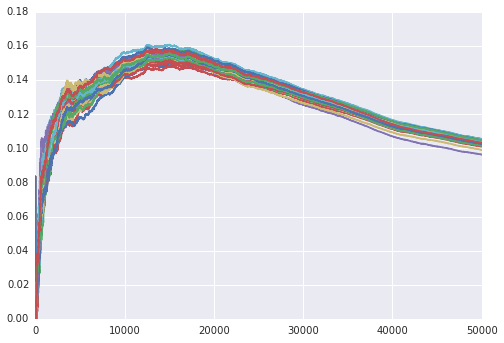

In [24]:
for dim in range(105):
    plt.plot(range(50000), running_acceptance_rates[dim,:])

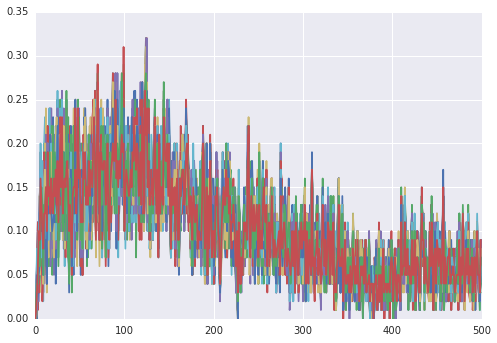

In [25]:
for dim in range(105):
    plt.plot(range(500), running_acceptance_rates_100window[dim, :])

In [26]:
acceptance_rates = np.zeros((len(traces['b'][0][0],)))
vector_acceptance_rate = 0
running_acceptance_rates = np.zeros((len(traces['b'][0][0]), len(traces['b'][0])))
running_acceptance_rates_100window = np.zeros((len(traces['b'][0][0]), 500))
n_vector_acceptances = 0
n_100windowvec_acceptances = 0
running_acceptance_rates_vec = np.zeros((1, len(traces['b'][0])))
running_acceptances_rates_vec_100window = np.zeros((1, 500))
for dim in range(len(traces['b'][0][0])):
    n_100window_acceptances = 0
    n_acceptances = 0
    
    for iteration in range(1, len(traces['b'][0])):
        if dim == 0:
            comparison = traces['b'][0][iteration] == traces['b'][0][iteration-1]
            if not np.all(comparison):
                n_vector_acceptances += 1
                n_100windowvec_acceptances += 1
            running_acceptance_rates_vec[0, iteration] = float(n_vector_acceptances)/iteration
            if iteration % 100 == 0:
                running_acceptances_rates_vec_100window[0, iteration/100] = float(n_100windowvec_acceptances)/100
                n_100windowvec_acceptances = 0
        if traces['b'][0][iteration][dim] != traces['b'][0][iteration-1][dim]:
            n_acceptances += 1
            n_100window_acceptances += 1
        running_acceptance_rates[dim, iteration] = float(n_acceptances)/iteration
        
        if iteration % 100 == 0:
            running_acceptance_rates_100window[dim, iteration/100] = float(n_100window_acceptances)/100
            n_100window_acceptances = 0
            
    acceptance_rates[dim] = float(n_acceptances)/len(traces['b'][0])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
print 'n vector acceptances: ',n_vector_acceptances
print 'Acceptance rate for vector: ',float(n_vector_acceptances)/len(traces['b'][0])
running_acceptance_rates
running_acceptance_rates_100window
running_acceptance_rates_vec
running_acceptances_rates_vec_100window

N acceptances for parameter:  bind_L_R_to_LR_kf  =  5154  acceptance rate:  0.10308
N acceptances for parameter:  bind_L_R_to_LR_kr  =  5218  acceptance rate:  0.10436
N acceptances for parameter:  convert_LR_to_DISC_kc  =  5150  acceptance rate:  0.103
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  5281  acceptance rate:  0.10562
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  5134  acceptance rate:  0.10268
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  5106  acceptance rate:  0.10212
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  5142  acceptance rate:  0.10284
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  5164  acceptance rate:  0.10328
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  5239  acceptance rate:  0.10478
N acceptances for parameter:  bind_DISC_flip_kf  =  5182  acceptance rate:  0.10364
N acceptances for parameter:  bind_DISC_flip_kr  =  5126  acceptance rate:  0.10

array([[ 0.  ,  0.02,  0.05,  0.08,  0.16,  0.23,  0.28,  0.25,  0.25,
         0.34,  0.37,  0.28,  0.19,  0.38,  0.32,  0.35,  0.32,  0.23,
         0.28,  0.31,  0.28,  0.31,  0.28,  0.26,  0.39,  0.29,  0.23,
         0.28,  0.26,  0.36,  0.27,  0.35,  0.31,  0.31,  0.35,  0.3 ,
         0.31,  0.38,  0.28,  0.17,  0.33,  0.19,  0.23,  0.28,  0.29,
         0.35,  0.26,  0.23,  0.32,  0.25,  0.2 ,  0.2 ,  0.29,  0.32,
         0.23,  0.3 ,  0.13,  0.29,  0.23,  0.15,  0.21,  0.18,  0.19,
         0.16,  0.12,  0.27,  0.13,  0.21,  0.17,  0.23,  0.26,  0.25,
         0.32,  0.36,  0.22,  0.2 ,  0.2 ,  0.21,  0.15,  0.19,  0.21,
         0.22,  0.22,  0.21,  0.21,  0.2 ,  0.2 ,  0.15,  0.18,  0.23,
         0.19,  0.18,  0.22,  0.18,  0.25,  0.13,  0.1 ,  0.14,  0.15,
         0.21,  0.17,  0.19,  0.17,  0.23,  0.17,  0.15,  0.13,  0.16,
         0.11,  0.11,  0.14,  0.08,  0.07,  0.08,  0.1 ,  0.11,  0.07,
         0.11,  0.16,  0.06,  0.15,  0.13,  0.09,  0.06,  0.1 ,  0.09,
      

In [32]:
acceptance_rates = np.zeros((len(traces['b'][1][0],)))
vector_acceptance_rate = 0
running_acceptance_rates = np.zeros((len(traces['b'][1][0]), len(traces['b'][1])))
running_acceptance_rates_100window = np.zeros((len(traces['b'][1][0]), 500))
n_vector_acceptances = 0
n_100windowvec_acceptances = 0
running_acceptance_rates_vec = np.zeros((1, len(traces['b'][1])))
running_acceptances_rates_vec_100window = np.zeros((1, 500))
for dim in range(len(traces['b'][1][0])):
    n_100window_acceptances = 0
    n_acceptances = 0
    
    for iteration in range(1, len(traces['b'][1])):
        if dim == 0:
            comparison = traces['b'][1][iteration] == traces['b'][1][iteration-1]
            if not np.all(comparison):
                n_vector_acceptances += 1
                n_100windowvec_acceptances += 1
            running_acceptance_rates_vec[0, iteration] = float(n_vector_acceptances)/iteration
            if iteration % 100 == 0:
                running_acceptances_rates_vec_100window[0, iteration/100] = float(n_100windowvec_acceptances)/100
                n_100windowvec_acceptances = 0
        if traces['b'][1][iteration][dim] != traces['b'][1][iteration-1][dim]:
            n_acceptances += 1
            n_100window_acceptances += 1
        running_acceptance_rates[dim, iteration] = float(n_acceptances)/iteration
        
        if iteration % 100 == 0:
            running_acceptance_rates_100window[dim, iteration/100] = float(n_100window_acceptances)/100
            n_100window_acceptances = 0
            
    acceptance_rates[dim] = float(n_acceptances)/len(traces['b'][1])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
print 'n vector acceptances: ',n_vector_acceptances
print 'Acceptance rate for vector: ',float(n_vector_acceptances)/len(traces['b'][1])
running_acceptance_rates
running_acceptance_rates_100window
running_acceptance_rates_vec
running_acceptances_rates_vec_100window

N acceptances for parameter:  bind_L_R_to_LR_kf  =  5412  acceptance rate:  0.10824
N acceptances for parameter:  bind_L_R_to_LR_kr  =  5447  acceptance rate:  0.10894
N acceptances for parameter:  convert_LR_to_DISC_kc  =  5411  acceptance rate:  0.10822
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  5496  acceptance rate:  0.10992
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  5390  acceptance rate:  0.1078
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  5360  acceptance rate:  0.1072
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  5408  acceptance rate:  0.10816
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  5397  acceptance rate:  0.10794
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  5463  acceptance rate:  0.10926
N acceptances for parameter:  bind_DISC_flip_kf  =  5384  acceptance rate:  0.10768
N acceptances for parameter:  bind_DISC_flip_kr  =  5360  acceptance rate:  0.10

array([[ 0.  ,  0.01,  0.06,  0.1 ,  0.17,  0.19,  0.28,  0.25,  0.33,
         0.21,  0.28,  0.39,  0.31,  0.24,  0.4 ,  0.29,  0.3 ,  0.26,
         0.33,  0.34,  0.39,  0.29,  0.35,  0.24,  0.3 ,  0.35,  0.32,
         0.42,  0.37,  0.43,  0.33,  0.32,  0.33,  0.31,  0.26,  0.28,
         0.35,  0.21,  0.2 ,  0.28,  0.3 ,  0.31,  0.29,  0.18,  0.11,
         0.21,  0.24,  0.16,  0.11,  0.17,  0.27,  0.24,  0.29,  0.25,
         0.23,  0.17,  0.15,  0.18,  0.1 ,  0.14,  0.28,  0.19,  0.16,
         0.2 ,  0.17,  0.27,  0.2 ,  0.25,  0.15,  0.1 ,  0.15,  0.14,
         0.16,  0.13,  0.17,  0.22,  0.1 ,  0.21,  0.21,  0.23,  0.18,
         0.21,  0.11,  0.13,  0.15,  0.08,  0.05,  0.16,  0.19,  0.11,
         0.11,  0.16,  0.13,  0.06,  0.14,  0.05,  0.18,  0.2 ,  0.2 ,
         0.26,  0.3 ,  0.3 ,  0.18,  0.25,  0.24,  0.18,  0.23,  0.25,
         0.26,  0.2 ,  0.24,  0.19,  0.2 ,  0.21,  0.31,  0.25,  0.22,
         0.19,  0.09,  0.1 ,  0.12,  0.1 ,  0.21,  0.25,  0.27,  0.16,
      

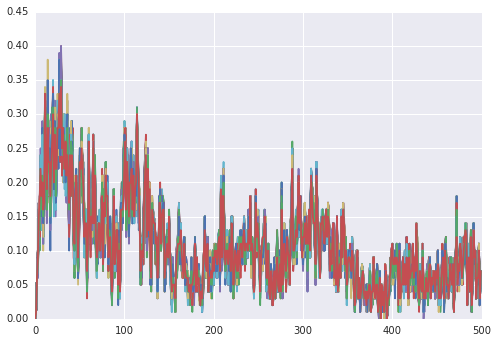

In [33]:
acceptance_rates = np.zeros((len(traces['b'][0][0],)))
vector_acceptance_rate = 0
running_acceptance_rates = np.zeros((len(traces['b'][0][0]), len(traces['b'][0])))
running_acceptance_rates_100window = np.zeros((len(traces['b'][0][0]), 500))
n_vector_acceptances = 0
n_100windowvec_acceptances = 0
running_acceptance_rates_vec = np.zeros((1, len(traces['b'][0])))
running_acceptances_rates_vec_100window = np.zeros((1, 500))
for dim in range(len(traces['b'][0][0])):
    n_100window_acceptances = 0
    n_acceptances = 0
    
    for iteration in range(1, len(traces['b'][0])):
        if dim == 0:
            comparison = traces['b'][0][iteration] == traces['b'][0][iteration-1]
            if not np.all(comparison):
                n_vector_acceptances += 1
                n_100windowvec_acceptances += 1
            running_acceptance_rates_vec[0, iteration] = float(n_vector_acceptances)/iteration
            if iteration % 100 == 0:
                running_acceptances_rates_vec_100window[0, iteration/100] = float(n_100windowvec_acceptances)/100
                n_100windowvec_acceptances = 0
        if traces['b'][0][iteration][dim] != traces['b'][0][iteration-1][dim]:
            n_acceptances += 1
            n_100window_acceptances += 1
        running_acceptance_rates[dim, iteration] = float(n_acceptances)/iteration
        
        if iteration % 100 == 0:
            running_acceptance_rates_100window[dim, iteration/100] = float(n_100window_acceptances)/100
            n_100window_acceptances = 0
            
    acceptance_rates[dim] = float(n_acceptances)/len(traces['b'][0])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
print 'n vector acceptances: ',n_vector_acceptances
print 'Acceptance rate for vector: ',float(n_vector_acceptances)/len(traces['b'][0])
running_acceptance_rates
running_acceptance_rates_100window
running_acceptance_rates_vec
running_acceptances_rates_vec_100window

In [34]:
acceptance_rates = np.zeros((len(traces['b'][2][0],)))
vector_acceptance_rate = 0
running_acceptance_rates = np.zeros((len(traces['b'][2][0]), len(traces['b'][2])))
running_acceptance_rates_100window = np.zeros((len(traces['b'][2][0]), 500))
n_vector_acceptances = 0
n_100windowvec_acceptances = 0
running_acceptance_rates_vec = np.zeros((1, len(traces['b'][2])))
running_acceptances_rates_vec_100window = np.zeros((1, 500))
for dim in range(len(traces['b'][2][0])):
    n_100window_acceptances = 0
    n_acceptances = 0
    
    for iteration in range(1, len(traces['b'][2])):
        if dim == 0:
            comparison = traces['b'][2][iteration] == traces['b'][2][iteration-1]
            if not np.all(comparison):
                n_vector_acceptances += 1
                n_100windowvec_acceptances += 1
            running_acceptance_rates_vec[0, iteration] = float(n_vector_acceptances)/iteration
            if iteration % 100 == 0:
                running_acceptances_rates_vec_100window[0, iteration/100] = float(n_100windowvec_acceptances)/100
                n_100windowvec_acceptances = 0
        if traces['b'][2][iteration][dim] != traces['b'][2][iteration-1][dim]:
            n_acceptances += 1
            n_100window_acceptances += 1
        running_acceptance_rates[dim, iteration] = float(n_acceptances)/iteration
        
        if iteration % 100 == 0:
            running_acceptance_rates_100window[dim, iteration/100] = float(n_100window_acceptances)/100
            n_100window_acceptances = 0
            
    acceptance_rates[dim] = float(n_acceptances)/len(traces['b'][2])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
print 'n vector acceptances: ',n_vector_acceptances
print 'Acceptance rate for vector: ',float(n_vector_acceptances)/len(traces['b'][2])
running_acceptance_rates
running_acceptance_rates_100window
running_acceptance_rates_vec
running_acceptances_rates_vec_100window

N acceptances for parameter:  bind_L_R_to_LR_kf  =  4614  acceptance rate:  0.09228
N acceptances for parameter:  bind_L_R_to_LR_kr  =  4628  acceptance rate:  0.09256
N acceptances for parameter:  convert_LR_to_DISC_kc  =  4686  acceptance rate:  0.09372
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  4675  acceptance rate:  0.0935
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  4570  acceptance rate:  0.0914
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  4612  acceptance rate:  0.09224
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  4642  acceptance rate:  0.09284
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  4643  acceptance rate:  0.09286
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  4728  acceptance rate:  0.09456
N acceptances for parameter:  bind_DISC_flip_kf  =  4592  acceptance rate:  0.09184
N acceptances for parameter:  bind_DISC_flip_kr  =  4656  acceptance rate:  0.09

array([[ 0.  ,  0.  ,  0.09,  0.09,  0.15,  0.19,  0.32,  0.19,  0.32,
         0.33,  0.33,  0.31,  0.31,  0.3 ,  0.27,  0.32,  0.39,  0.31,
         0.28,  0.31,  0.35,  0.29,  0.27,  0.35,  0.33,  0.35,  0.36,
         0.33,  0.45,  0.23,  0.32,  0.34,  0.29,  0.32,  0.21,  0.39,
         0.27,  0.3 ,  0.37,  0.24,  0.3 ,  0.32,  0.37,  0.37,  0.35,
         0.27,  0.22,  0.09,  0.14,  0.3 ,  0.24,  0.29,  0.21,  0.2 ,
         0.25,  0.21,  0.19,  0.22,  0.16,  0.26,  0.23,  0.29,  0.29,
         0.24,  0.19,  0.11,  0.19,  0.17,  0.06,  0.15,  0.14,  0.16,
         0.16,  0.16,  0.25,  0.19,  0.16,  0.31,  0.21,  0.29,  0.23,
         0.27,  0.25,  0.21,  0.23,  0.26,  0.24,  0.24,  0.26,  0.16,
         0.19,  0.19,  0.25,  0.18,  0.23,  0.25,  0.19,  0.15,  0.08,
         0.19,  0.19,  0.18,  0.17,  0.27,  0.22,  0.17,  0.19,  0.23,
         0.25,  0.17,  0.16,  0.12,  0.13,  0.13,  0.12,  0.11,  0.1 ,
         0.02,  0.07,  0.11,  0.1 ,  0.09,  0.08,  0.07,  0.06,  0.13,
      

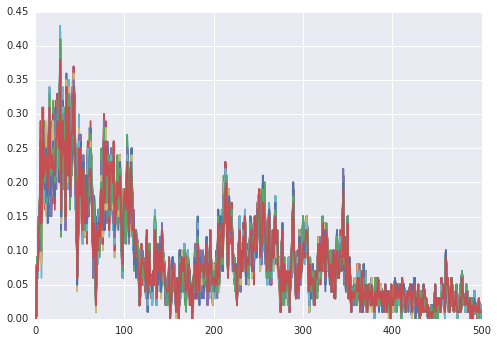

In [35]:
for dim in range(105):
    plt.plot(range(500), running_acceptance_rates_100window[dim, :])

In [28]:
acceptance_rates = np.zeros((len(traces['c'][0][0],)))
vector_acceptance_rate = 0
running_acceptance_rates = np.zeros((len(traces['c'][0][0]), len(traces['c'][0])))
running_acceptance_rates_100window = np.zeros((len(traces['c'][0][0]), 500))
n_vector_acceptances = 0
n_100windowvec_acceptances = 0
running_acceptance_rates_vec = np.zeros((1, len(traces['c'][0])))
running_acceptances_rates_vec_100window = np.zeros((1, 500))
for dim in range(len(traces['c'][0][0])):
    n_100window_acceptances = 0
    n_acceptances = 0
    
    for iteration in range(1, len(traces['c'][0])):
        if dim == 0:
            comparison = traces['c'][0][iteration] == traces['c'][0][iteration-1]
            if not np.all(comparison):
                n_vector_acceptances += 1
                n_100windowvec_acceptances += 1
            running_acceptance_rates_vec[0, iteration] = float(n_vector_acceptances)/iteration
            if iteration % 100 == 0:
                running_acceptances_rates_vec_100window[0, iteration/100] = float(n_100windowvec_acceptances)/100
                n_100windowvec_acceptances = 0
        if traces['c'][0][iteration][dim] != traces['c'][0][iteration-1][dim]:
            n_acceptances += 1
            n_100window_acceptances += 1
        running_acceptance_rates[dim, iteration] = float(n_acceptances)/iteration
        
        if iteration % 100 == 0:
            running_acceptance_rates_100window[dim, iteration/100] = float(n_100window_acceptances)/100
            n_100window_acceptances = 0
            
    acceptance_rates[dim] = float(n_acceptances)/len(traces['c'][0])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
print 'n vector acceptances: ',n_vector_acceptances
print 'Acceptance rate for vector: ',float(n_vector_acceptances)/len(traces['c'][0])
running_acceptance_rates
running_acceptance_rates_100window
running_acceptance_rates_vec
running_acceptances_rates_vec_100window

N acceptances for parameter:  bind_L_R_to_LR_kf  =  3155  acceptance rate:  0.0631
N acceptances for parameter:  bind_L_R_to_LR_kr  =  3117  acceptance rate:  0.06234
N acceptances for parameter:  convert_LR_to_DISC_kc  =  2787  acceptance rate:  0.05574
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  3018  acceptance rate:  0.06036
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  3228  acceptance rate:  0.06456
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  3112  acceptance rate:  0.06224
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  3121  acceptance rate:  0.06242
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  2945  acceptance rate:  0.0589
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  2738  acceptance rate:  0.05476
N acceptances for parameter:  bind_DISC_flip_kf  =  3159  acceptance rate:  0.06318
N acceptances for parameter:  bind_DISC_flip_kr  =  3165  acceptance rate:  0.06

array([[ 0.  ,  0.04,  0.1 ,  0.15,  0.1 ,  0.15,  0.17,  0.31,  0.29,
         0.3 ,  0.24,  0.39,  0.3 ,  0.33,  0.35,  0.35,  0.39,  0.31,
         0.37,  0.36,  0.4 ,  0.33,  0.31,  0.31,  0.43,  0.3 ,  0.32,
         0.38,  0.38,  0.27,  0.28,  0.41,  0.29,  0.28,  0.25,  0.3 ,
         0.28,  0.32,  0.29,  0.33,  0.27,  0.3 ,  0.32,  0.33,  0.37,
         0.25,  0.31,  0.27,  0.28,  0.26,  0.27,  0.27,  0.28,  0.22,
         0.36,  0.28,  0.27,  0.23,  0.29,  0.25,  0.27,  0.3 ,  0.17,
         0.21,  0.33,  0.33,  0.28,  0.3 ,  0.25,  0.24,  0.3 ,  0.23,
         0.16,  0.16,  0.21,  0.16,  0.25,  0.28,  0.25,  0.25,  0.31,
         0.19,  0.19,  0.19,  0.24,  0.15,  0.22,  0.18,  0.2 ,  0.24,
         0.27,  0.28,  0.22,  0.21,  0.2 ,  0.21,  0.22,  0.23,  0.2 ,
         0.19,  0.17,  0.18,  0.19,  0.19,  0.12,  0.27,  0.28,  0.19,
         0.23,  0.26,  0.21,  0.16,  0.18,  0.23,  0.15,  0.13,  0.16,
         0.19,  0.1 ,  0.13,  0.12,  0.11,  0.16,  0.2 ,  0.12,  0.16,
      

In [36]:
acceptance_rates = np.zeros((len(traces['c'][1][0],)))
vector_acceptance_rate = 0
running_acceptance_rates = np.zeros((len(traces['c'][1][0]), len(traces['c'][1])))
running_acceptance_rates_100window = np.zeros((len(traces['c'][1][0]), 500))
n_vector_acceptances = 0
n_100windowvec_acceptances = 0
running_acceptance_rates_vec = np.zeros((1, len(traces['c'][1])))
running_acceptances_rates_vec_100window = np.zeros((1, 500))
for dim in range(len(traces['c'][1][0])):
    n_100window_acceptances = 0
    n_acceptances = 0
    
    for iteration in range(1, len(traces['c'][1])):
        if dim == 0:
            comparison = traces['c'][1][iteration] == traces['c'][1][iteration-1]
            if not np.all(comparison):
                n_vector_acceptances += 1
                n_100windowvec_acceptances += 1
            running_acceptance_rates_vec[0, iteration] = float(n_vector_acceptances)/iteration
            if iteration % 100 == 0:
                running_acceptances_rates_vec_100window[0, iteration/100] = float(n_100windowvec_acceptances)/100
                n_100windowvec_acceptances = 0
        if traces['c'][1][iteration][dim] != traces['c'][1][iteration-1][dim]:
            n_acceptances += 1
            n_100window_acceptances += 1
        running_acceptance_rates[dim, iteration] = float(n_acceptances)/iteration
        
        if iteration % 100 == 0:
            running_acceptance_rates_100window[dim, iteration/100] = float(n_100window_acceptances)/100
            n_100window_acceptances = 0
            
    acceptance_rates[dim] = float(n_acceptances)/len(traces['c'][1])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
print 'n vector acceptances: ',n_vector_acceptances
print 'Acceptance rate for vector: ',float(n_vector_acceptances)/len(traces['c'][1])
running_acceptance_rates
running_acceptance_rates_100window
running_acceptance_rates_vec
running_acceptances_rates_vec_100window

N acceptances for parameter:  bind_L_R_to_LR_kf  =  2506  acceptance rate:  0.05012
N acceptances for parameter:  bind_L_R_to_LR_kr  =  2355  acceptance rate:  0.0471
N acceptances for parameter:  convert_LR_to_DISC_kc  =  2408  acceptance rate:  0.04816
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  2561  acceptance rate:  0.05122
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  2242  acceptance rate:  0.04484
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  2301  acceptance rate:  0.04602
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  2473  acceptance rate:  0.04946
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  2566  acceptance rate:  0.05132
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  2515  acceptance rate:  0.0503
N acceptances for parameter:  bind_DISC_flip_kf  =  2504  acceptance rate:  0.05008
N acceptances for parameter:  bind_DISC_flip_kr  =  2345  acceptance rate:  0.04

array([[ 0.  ,  0.05,  0.09,  0.16,  0.11,  0.27,  0.26,  0.22,  0.2 ,
         0.28,  0.31,  0.31,  0.33,  0.37,  0.28,  0.27,  0.31,  0.3 ,
         0.35,  0.27,  0.24,  0.37,  0.3 ,  0.3 ,  0.33,  0.39,  0.37,
         0.37,  0.29,  0.3 ,  0.37,  0.33,  0.3 ,  0.34,  0.33,  0.33,
         0.32,  0.33,  0.31,  0.26,  0.24,  0.37,  0.39,  0.3 ,  0.35,
         0.4 ,  0.39,  0.39,  0.3 ,  0.34,  0.31,  0.24,  0.34,  0.26,
         0.26,  0.29,  0.21,  0.22,  0.25,  0.21,  0.21,  0.24,  0.17,
         0.28,  0.28,  0.26,  0.22,  0.23,  0.3 ,  0.27,  0.25,  0.31,
         0.25,  0.23,  0.25,  0.2 ,  0.19,  0.25,  0.37,  0.29,  0.2 ,
         0.16,  0.3 ,  0.24,  0.2 ,  0.23,  0.31,  0.18,  0.21,  0.19,
         0.23,  0.08,  0.16,  0.2 ,  0.23,  0.12,  0.08,  0.19,  0.12,
         0.07,  0.15,  0.14,  0.13,  0.12,  0.07,  0.07,  0.13,  0.1 ,
         0.17,  0.18,  0.14,  0.15,  0.11,  0.18,  0.13,  0.08,  0.15,
         0.15,  0.14,  0.16,  0.19,  0.12,  0.09,  0.14,  0.14,  0.14,
      

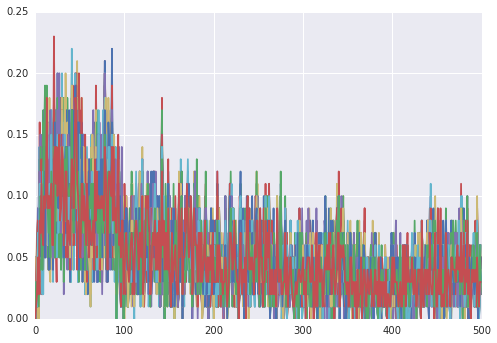

In [37]:
for dim in range(105):
    plt.plot(range(500), running_acceptance_rates_100window[dim, :])

In [38]:
acceptance_rates = np.zeros((len(traces['c'][2][0],)))
vector_acceptance_rate = 0
running_acceptance_rates = np.zeros((len(traces['c'][2][0]), len(traces['c'][2])))
running_acceptance_rates_100window = np.zeros((len(traces['c'][2][0]), 500))
n_vector_acceptances = 0
n_100windowvec_acceptances = 0
running_acceptance_rates_vec = np.zeros((1, len(traces['c'][2])))
running_acceptances_rates_vec_100window = np.zeros((1, 500))
for dim in range(len(traces['c'][2][0])):
    n_100window_acceptances = 0
    n_acceptances = 0
    
    for iteration in range(1, len(traces['c'][2])):
        if dim == 0:
            comparison = traces['c'][2][iteration] == traces['c'][2][iteration-1]
            if not np.all(comparison):
                n_vector_acceptances += 1
                n_100windowvec_acceptances += 1
            running_acceptance_rates_vec[0, iteration] = float(n_vector_acceptances)/iteration
            if iteration % 100 == 0:
                running_acceptances_rates_vec_100window[0, iteration/100] = float(n_100windowvec_acceptances)/100
                n_100windowvec_acceptances = 0
        if traces['c'][2][iteration][dim] != traces['c'][2][iteration-1][dim]:
            n_acceptances += 1
            n_100window_acceptances += 1
        running_acceptance_rates[dim, iteration] = float(n_acceptances)/iteration
        
        if iteration % 100 == 0:
            running_acceptance_rates_100window[dim, iteration/100] = float(n_100window_acceptances)/100
            n_100window_acceptances = 0
            
    acceptance_rates[dim] = float(n_acceptances)/len(traces['c'][2])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
print 'n vector acceptances: ',n_vector_acceptances
print 'Acceptance rate for vector: ',float(n_vector_acceptances)/len(traces['c'][2])
running_acceptance_rates
running_acceptance_rates_100window
running_acceptance_rates_vec
running_acceptances_rates_vec_100window

N acceptances for parameter:  bind_L_R_to_LR_kf  =  3167  acceptance rate:  0.06334
N acceptances for parameter:  bind_L_R_to_LR_kr  =  2967  acceptance rate:  0.05934
N acceptances for parameter:  convert_LR_to_DISC_kc  =  2888  acceptance rate:  0.05776
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  3046  acceptance rate:  0.06092
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  3050  acceptance rate:  0.061
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  3077  acceptance rate:  0.06154
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  3023  acceptance rate:  0.06046
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  3148  acceptance rate:  0.06296
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  2926  acceptance rate:  0.05852
N acceptances for parameter:  bind_DISC_flip_kf  =  3147  acceptance rate:  0.06294
N acceptances for parameter:  bind_DISC_flip_kr  =  3007  acceptance rate:  0.06

array([[ 0.  ,  0.04,  0.09,  0.16,  0.14,  0.26,  0.21,  0.23,  0.21,
         0.25,  0.26,  0.31,  0.25,  0.35,  0.27,  0.23,  0.33,  0.37,
         0.33,  0.37,  0.41,  0.3 ,  0.25,  0.24,  0.28,  0.37,  0.36,
         0.34,  0.25,  0.39,  0.27,  0.2 ,  0.29,  0.25,  0.33,  0.22,
         0.33,  0.31,  0.26,  0.32,  0.33,  0.25,  0.27,  0.29,  0.25,
         0.35,  0.28,  0.28,  0.24,  0.23,  0.31,  0.34,  0.31,  0.27,
         0.27,  0.3 ,  0.3 ,  0.19,  0.25,  0.23,  0.33,  0.27,  0.17,
         0.26,  0.3 ,  0.25,  0.24,  0.25,  0.29,  0.18,  0.29,  0.15,
         0.2 ,  0.26,  0.27,  0.33,  0.28,  0.19,  0.27,  0.33,  0.24,
         0.24,  0.22,  0.25,  0.16,  0.27,  0.18,  0.17,  0.19,  0.2 ,
         0.15,  0.14,  0.17,  0.15,  0.14,  0.23,  0.16,  0.24,  0.2 ,
         0.19,  0.16,  0.15,  0.18,  0.18,  0.09,  0.22,  0.13,  0.16,
         0.16,  0.12,  0.21,  0.18,  0.14,  0.2 ,  0.21,  0.16,  0.21,
         0.21,  0.16,  0.18,  0.18,  0.11,  0.13,  0.2 ,  0.22,  0.15,
      

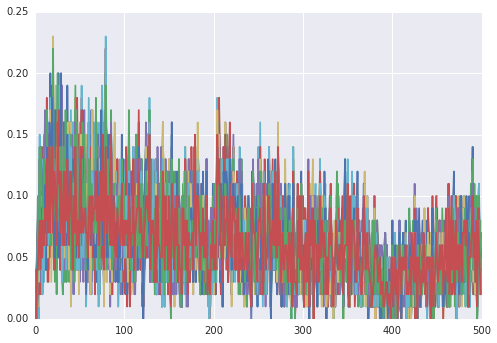

In [39]:
for dim in range(105):
    plt.plot(range(500), running_acceptance_rates_100window[dim, :])

In [30]:
acceptance_rates = np.zeros((len(traces['d'][0][0],)))
vector_acceptance_rate = 0
running_acceptance_rates = np.zeros((len(traces['d'][0][0]), len(traces['d'][0])))
running_acceptance_rates_100window = np.zeros((len(traces['d'][0][0]), 500))
n_vector_acceptances = 0
n_100windowvec_acceptances = 0
running_acceptance_rates_vec = np.zeros((1, len(traces['d'][0])))
running_acceptances_rates_vec_100window = np.zeros((1, 500))
for dim in range(len(traces['d'][0][0])):
    n_100window_acceptances = 0
    n_acceptances = 0
    
    for iteration in range(1, len(traces['d'][0])):
        if dim == 0:
            comparison = traces['d'][0][iteration] == traces['d'][0][iteration-1]
            if not np.all(comparison):
                n_vector_acceptances += 1
                n_100windowvec_acceptances += 1
            running_acceptance_rates_vec[0, iteration] = float(n_vector_acceptances)/iteration
            if iteration % 100 == 0:
                running_acceptances_rates_vec_100window[0, iteration/100] = float(n_100windowvec_acceptances)/100
                n_100windowvec_acceptances = 0
        if traces['d'][0][iteration][dim] != traces['d'][0][iteration-1][dim]:
            n_acceptances += 1
            n_100window_acceptances += 1
        running_acceptance_rates[dim, iteration] = float(n_acceptances)/iteration
        
        if iteration % 100 == 0:
            running_acceptance_rates_100window[dim, iteration/100] = float(n_100window_acceptances)/100
            n_100window_acceptances = 0
            
    acceptance_rates[dim] = float(n_acceptances)/len(traces['d'][0])
    print 'N acceptances for parameter: ',str(param_trace_dict_a['param_list'][dim]),' = ',str(n_acceptances),' acceptance rate: ',str(acceptance_rates[dim])
    n_acceptances = 0
print 'n vector acceptances: ',n_vector_acceptances
print 'Acceptance rate for vector: ',float(n_vector_acceptances)/len(traces['d'][0])
running_acceptance_rates
running_acceptance_rates_100window
running_acceptance_rates_vec
running_acceptances_rates_vec_100window

N acceptances for parameter:  bind_L_R_to_LR_kf  =  4412  acceptance rate:  0.08824
N acceptances for parameter:  bind_L_R_to_LR_kr  =  4410  acceptance rate:  0.0882
N acceptances for parameter:  convert_LR_to_DISC_kc  =  4410  acceptance rate:  0.0882
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kf  =  4421  acceptance rate:  0.08842
N acceptances for parameter:  bind_DISC_C8pro_to_DISCC8pro_kr  =  4418  acceptance rate:  0.08836
N acceptances for parameter:  catalyze_DISCC8pro_to_DISC_C8A_kc  =  4412  acceptance rate:  0.08824
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kf  =  4437  acceptance rate:  0.08874
N acceptances for parameter:  bind_C8A_BidU_to_C8ABidU_kr  =  4440  acceptance rate:  0.0888
N acceptances for parameter:  catalyze_C8ABidU_to_C8A_BidT_kc  =  4441  acceptance rate:  0.08882
N acceptances for parameter:  bind_DISC_flip_kf  =  4379  acceptance rate:  0.08758
N acceptances for parameter:  bind_DISC_flip_kr  =  4429  acceptance rate:  0.088

array([[ 0.  ,  0.01,  0.07,  0.12,  0.16,  0.21,  0.25,  0.32,  0.37,
         0.21,  0.3 ,  0.22,  0.2 ,  0.26,  0.3 ,  0.3 ,  0.19,  0.27,
         0.26,  0.25,  0.25,  0.16,  0.19,  0.31,  0.19,  0.19,  0.19,
         0.19,  0.18,  0.19,  0.13,  0.18,  0.28,  0.17,  0.16,  0.17,
         0.14,  0.16,  0.27,  0.17,  0.12,  0.18,  0.17,  0.17,  0.26,
         0.18,  0.26,  0.21,  0.17,  0.23,  0.24,  0.23,  0.17,  0.18,
         0.21,  0.31,  0.15,  0.26,  0.21,  0.24,  0.24,  0.17,  0.24,
         0.17,  0.2 ,  0.2 ,  0.21,  0.22,  0.2 ,  0.19,  0.14,  0.24,
         0.19,  0.19,  0.24,  0.14,  0.12,  0.2 ,  0.2 ,  0.24,  0.23,
         0.16,  0.16,  0.09,  0.1 ,  0.15,  0.17,  0.21,  0.08,  0.15,
         0.17,  0.12,  0.2 ,  0.23,  0.14,  0.1 ,  0.1 ,  0.19,  0.15,
         0.17,  0.1 ,  0.1 ,  0.1 ,  0.16,  0.14,  0.18,  0.1 ,  0.14,
         0.18,  0.14,  0.17,  0.14,  0.19,  0.17,  0.14,  0.11,  0.15,
         0.21,  0.18,  0.24,  0.17,  0.17,  0.18,  0.16,  0.12,  0.05,
      

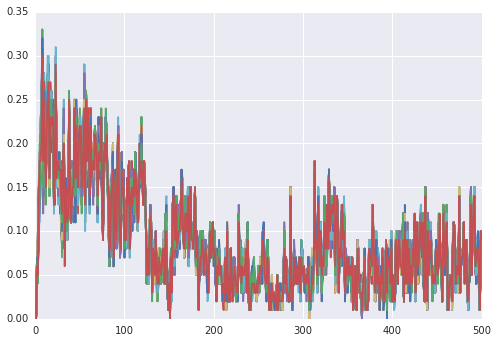

In [31]:
for dim in range(105):
    plt.plot(range(500), running_acceptance_rates_100window[dim, :])